<a href="https://colab.research.google.com/github/DanielhCarranza/Machine-Learning-in-Health/blob/master/Glaucoma.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Glaucoma Detection

## Clinical Background

Glaucoma is currently the leading reason of irreversible blindness in the world. It is commonly caused by elevated intraocular pressure (IOP), which causes mechanical straining and torsion of optic nerve and loss of retinal nerve fibers. Glaucoma changes the morphology of optic nerve head (ONH) and is usually characterized by the larger cup to disc ratio (CDR), pale disc, disc hemorrhage, etc. in the ONH region, while in OCT images thinning of retinal nerve fiber layer could be seen at the early stage.

 

The optic cup is the central cup-like area in the optic disc. The CDR is the comparison of the diameter of the cup to disc, which partially represents disease status. Determination of CDR varies among doctors and can be influenced by subjectivity. The normal CDR is 0.3 to 0.4. A larger CDR may indicate glaucoma or other diseases such as neuro-ophthalmic diseases. Previous studies showed that larger vertical (not horizontal) CDR is closely associated with progression of glaucoma. Although not accurate enough, CDR is very useful in clinical practice and evaluation of glaucoma.
All images are centered at the posterior pole with both macula and optic disc
![texto alternativo](https://refuge.grand-challenge.org/media/REFUGE/public_html/example.jpg)




**Resources**:
* [Challenge](https://refuge.grand-challenge.org/Background/)

### Setup

In [ ]:
# Training
! curl -L https://www.dropbox.com/s/xd40dewhj0v5gw1/REFUGE-Training400.zip?dl=1 > REFUGE-Training400.zip
! curl -L https://www.dropbox.com/s/030vecfp36ikiml/Annotation-Training400.zip?dl=1 > Annotation-Training400.zip
  
# Validation
! curl -L https://www.dropbox.com/s/hhq1srz9ceot8sf/REFUGE-Validation400.zip?dl=1 > REFUGE-Validation400.zip
! curl -L https://www.dropbox.com/s/sdgfefzomm5auog/REFUGE-Validation400-GT.zip?dl=1 > REFUGE-Validation400-GT.zip
  
# Test
! curl -L https://www.dropbox.com/s/t1ijw6mdqhd79dm/REFUGE-Test400.zip?dl=1 > REFUGE-Test400.zip
  

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  683M  100  683M    0     0  45.5M      0  0:00:15  0:00:15 --:--:-- 54.2M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  331M  100  331M    0     0  48.2M      0  0:00:06  0:00:06 --:--:-- 56.9M
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:

In [ ]:
! mkdir GlaucomaData
! unzip REFUGE-Training400.zip -d GlaucomaData
! unzip Annotation-Training400.zip  -d GlaucomaData
! unzip REFUGE-Validation400.zip  -d GlaucomaData
! unzip REFUGE-Validation400-GT.zip  -d GlaucomaData
! unzip REFUGE-Test400.zip -d GlaucomaData

In [ ]:
! pip install git+https://github.com/fastai/fastai.git

In [ ]:
! nvidia-smi

Fri Feb 21 23:37:34 2020       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 440.48.02    Driver Version: 418.67       CUDA Version: 10.1     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   39C    P8     9W /  70W |      0MiB / 15079MiB |      0%      Default |
+-------------------------------+----------------------+----------------------+
                                                                               
+-----------------------------------------------------------------------------+
| Processes:                                                       GPU Memory |
|  GPU  

## EDA

In [ ]:
import fastai
from fastai import *
from fastai.vision import *
from fastai.callbacks import *
from fastai.callbacks.hooks import *
from fastai.vision.interpret import SegmentationInterpretation

import os
import cv2 
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.metrics import auc,roc_curve
from sklearn.metrics import classification_report

In [ ]:
path = Path('GlaucomaData')

In [ ]:
train_path =    (path/'Training400')
ann_train_path= (path/'Annotation-Training400/Disc_Cup_Masks')

valid_path =    (path/'REFUGE-Validation400')
ann_valid_path= (path/'REFUGE-Validation400-GT/Disc_Cup_Masks')

test_path =     (path/'Test400')
path.ls()

[PosixPath('GlaucomaData/__MACOSX'),
 PosixPath('GlaucomaData/Training400'),
 PosixPath('GlaucomaData/Annotation-Training400'),
 PosixPath('GlaucomaData/REFUGE-Validation400-GT'),
 PosixPath('GlaucomaData/Test400'),
 PosixPath('GlaucomaData/REFUGE-Validation400')]

In [ ]:
fovea_location = pd.read_excel(path/'Annotation-Training400/Fovea_location.xlsx')
fovea_location.head()

,ID,ImgName,Fovea_X,Fovea_Y
0,1,g0001.jpg,1057.95,1076.52
1,2,g0002.jpg,1190.59,1017.09
2,3,g0003.jpg,1070.56,1084.85
3,4,g0004.jpg,1072.60,1035.48
4,5,g0005.jpg,1058.19,1100.33


In [ ]:
glaucoma_files= get_image_files(train_path/'Glaucoma')
non_glaucoma_files= get_image_files(train_path/'Non-Glaucoma')
len(glaucoma_files), len(non_glaucoma_files)

(40, 360)

In [ ]:
img = open_image(glaucoma_files[0])
print(img.shape)



torch.Size([3, 2056, 2124])


In [ ]:
ann_train_path= (path/'Annotation-Training400/Disc_Cup_Masks')
ann_train_path.ls()

[PosixPath('GlaucomaData/Annotation-Training400/Disc_Cup_Masks/Non-Glaucoma'),
 PosixPath('GlaucomaData/Annotation-Training400/Disc_Cup_Masks/.DS_Store'),
 PosixPath('GlaucomaData/Annotation-Training400/Disc_Cup_Masks/Glaucoma')]

In [ ]:
mask_file = (ann_train_path/'Glaucoma').ls()[0]
mask= open_mask(mask_file)
print(mask.shape)

torch.Size([1, 2056, 2124])


In [ ]:
mask_fovea_file=(ann_train_path.parent/'Disc_Cup_Fovea_Illustration').ls()[0]
# open_image(mask_fovea_file)

# Classification

In [ ]:
classes= ['Glaucoma','Non-Glaucoma']
get_labels = lambda x: x.parts[-2]

src = (ImageList.from_folder(train_path)
       .split_by_rand_pct()
       .label_from_func(get_labels, classes=classes))

def get_data(bs, sz):
  return (src.transform(get_transforms(flip_vert=True), size=sz)
          .databunch(bs= bs, num_workers=4)
          .normalize(imagenet_stats))

In [ ]:
%time data= get_data(64,224)

CPU times: user 10.7 s, sys: 385 ms, total: 11.1 s
Wall time: 11.1 s


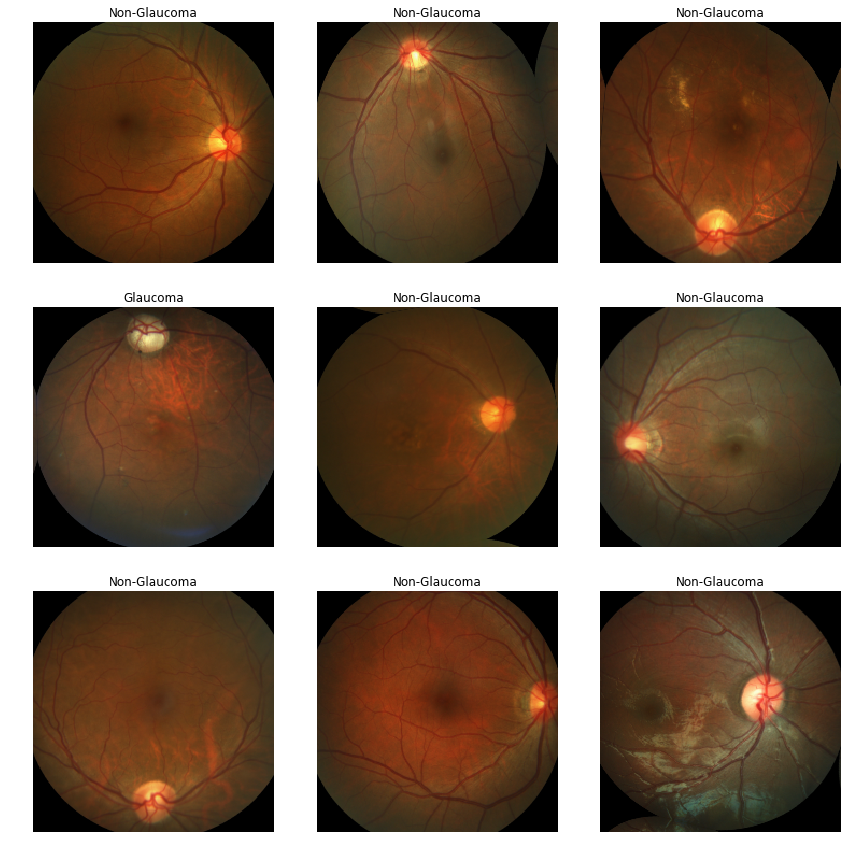

In [ ]:
data.show_batch(rows=3)

## Training

In [ ]:
cbfs = [ReduceLROnPlateauCallback,
        partial(SaveModelCallback,every='epoch',name='res50_256'),
        ShowGraph]

In [ ]:
learner= cnn_learner(data, models.resnet50, metrics= [accuracy], callback_fns=cbfs)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


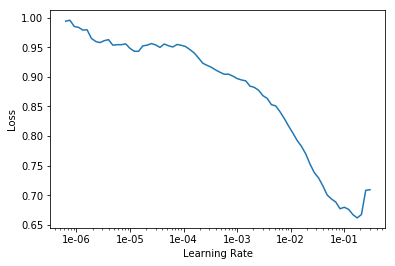

In [ ]:
learner.lr_find()
learner.recorder.plot()

epoch,train_loss,valid_loss,accuracy,time
0,0.937835,1.576194,0.075000,00:54
1,0.856982,1.224875,0.250000,00:52
2,0.815044,0.351858,0.850000,00:52
3,0.716922,0.367103,0.862500,00:53
4,0.616571,0.291865,0.887500,00:52
5,0.528242,0.232511,0.912500,00:52
6,0.460117,0.227057,0.925000,00:52
7,0.412054,0.217086,0.900000,00:53
8,0.371063,0.439531,0.812500,00:52
9,0.335246,0.200797,0.887500,00:52


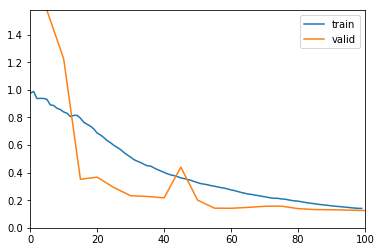

Epoch 3: reducing lr to 0.0015200000000000003
Epoch 8: reducing lr to 0.0017818323551421003
Epoch 12: reducing lr to 0.0010000040000000003
Epoch 13: reducing lr to 0.0007774839561274217
Epoch 14: reducing lr to 0.0005661219964173986


In [ ]:
lr= 1e-1
learner.fit_one_cycle(20, slice(1e-3,1e-2, lr))

In [ ]:
learner.save('res50_224_classification-975acc')

## Evaluation

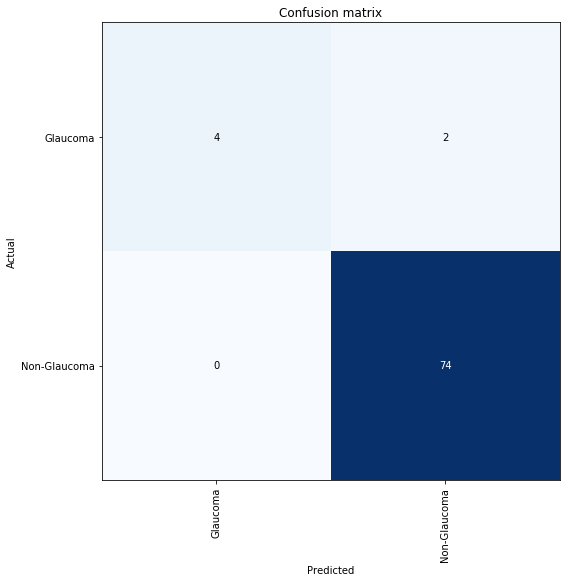

In [ ]:
interp = ClassificationInterpretation.from_learner(learner)
interp.plot_confusion_matrix(figsize=(10,8))

In [ ]:
# Predictions of the validation data
preds, y_true=learner.get_preds()
y_true.shape, preds.shape

(torch.Size([80]), torch.Size([80, 2]))

In [ ]:
y_true=y_true.numpy() 
preds=np.argmax(preds.numpy(), axis=-1)
y_true.shape, preds.shape

((80,), (80,))

In [ ]:
# Generate a classification report
report = classification_report(y_true, preds, target_names=classes)
print(report)

              precision    recall  f1-score   support

    Glaucoma       1.00      0.67      0.80         6
Non-Glaucoma       0.97      1.00      0.99        74

    accuracy                           0.97        80
   macro avg       0.99      0.83      0.89        80
weighted avg       0.98      0.97      0.97        80



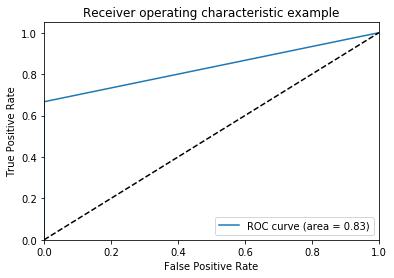

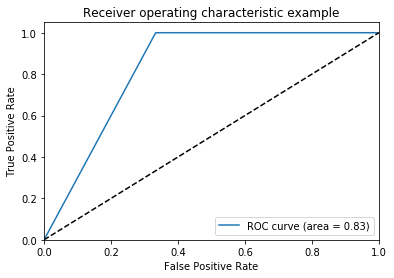

In [ ]:
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
n_classes=len(classes)
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(np.array(pd.get_dummies(y_true))[:, i], np.array(pd.get_dummies(preds))[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot of a ROC curve for a specific class
for i in range(n_classes):
    plt.figure()
    plt.plot(fpr[i], tpr[i], label='ROC curve (area = %0.2f)' % roc_auc[i])
    plt.plot([0, 1], [0, 1], 'k--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver operating characteristic example')
    plt.legend(loc="lower right")
    plt.show()

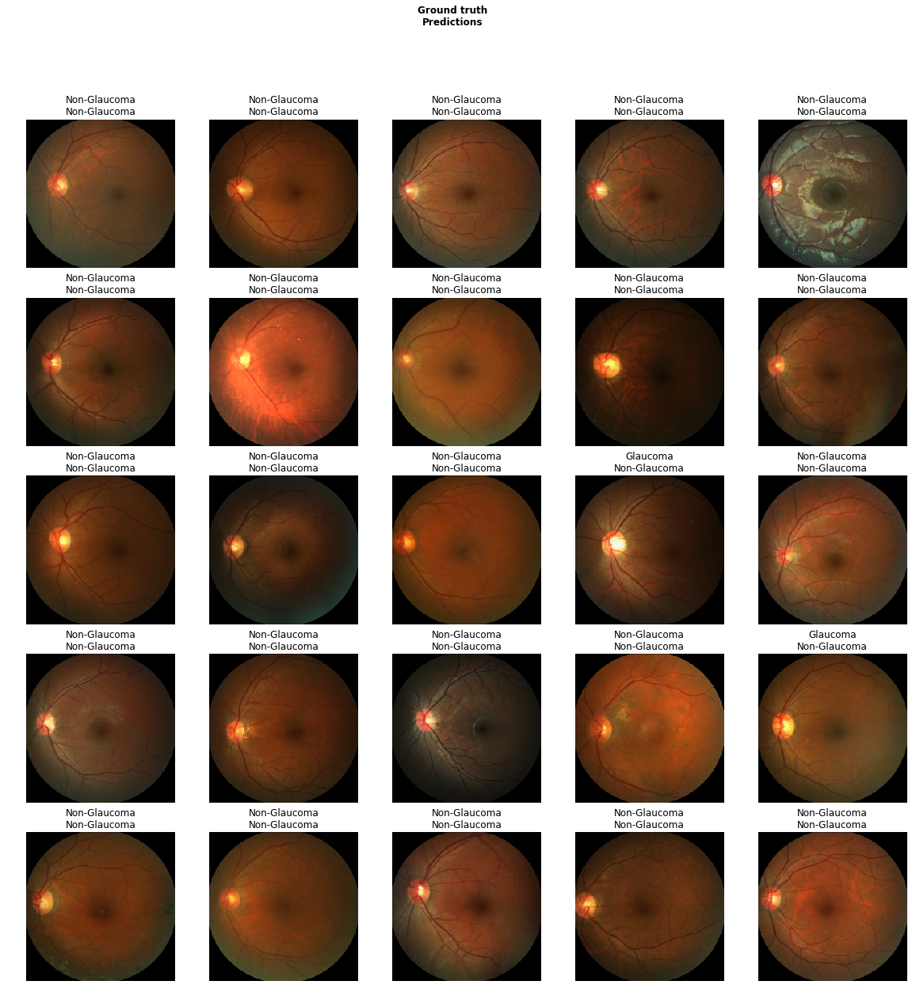

In [ ]:
learner.show_results()

#### Save Model

In [ ]:
learner.export(file='models/res50_224_classification-975acc.pkl')

In [ ]:
stage_model= 'res50_224_classification-975acc.pth'
model_file = 'res50_224_classification-975acc.pkl'
path_local_models = (train_path/'models')
model_local_path = str(path_local_models/model_file)
# upload_files_to_gcp(model_local_path, path_dermatology_models)
ls_gcp(path_dermatology_models)

gs://medbotai/models/Dermatology/Glaucoma_models/res50_224_classification-975acc.pkl
gs://medbotai/models/Dermatology/Glaucoma_models/res50_224_classification-975acc.pth


### HeatMap

In [ ]:
def heatMap(x,y,data, learner, size=(0,224,224,0)):
    """HeatMap"""
    
    # Evaluation mode
    m=learner.model.eval()
    
    # Denormalize the image
    xb,_ = data.one_item(x)
    xb_im = Image(data.denorm(xb)[0])
    xb = xb.cuda()
    
    # hook the activations
    with hook_output(m[0]) as hook_a: 
        with hook_output(m[0], grad=True) as hook_g:
            preds = m(xb)
            preds[0,int(y)].backward()

    # Activations    
    acts=hook_a.stored[0].cpu()
    
    # Avg of the activations
    avg_acts=acts.mean(0)
    
    # Show HeatMap
    _,ax = plt.subplots()
    xb_im.show(ax)
    ax.imshow(avg_acts, alpha=0.6, extent=size,
              interpolation='bilinear', cmap='magma')
    

Category Non-Glaucoma

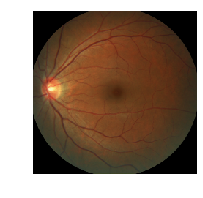

In [ ]:
x,y = data.valid_ds[2]
x.show()
data.valid_ds.y[2]

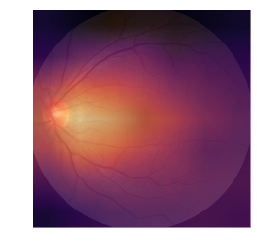

In [ ]:
heatMap(x,y,data,learner)

# Segmentation

In [ ]:
image_files= sorted(get_image_files(train_path, recurse=True) )
valid_files = sorted(get_image_files(valid_path))
masks_files= sorted(get_image_files(ann_train_path, recurse=True) )
valid_masks_files= sorted(get_image_files(ann_valid_path))

In [ ]:
image_files[0], masks_files[0], valid_masks_files[0]

(PosixPath('GlaucomaData/Training400/Glaucoma/g0001.jpg'),
 PosixPath('GlaucomaData/Annotation-Training400/Disc_Cup_Masks/Glaucoma/g0001.bmp'),
 PosixPath('GlaucomaData/REFUGE-Validation400-GT/Disc_Cup_Masks/V0001.bmp'))

In [ ]:
def get_masks(x): 
  mask_file= x.name.split('.')[0]
  if x.parts[1].startswith('Training'):
    mask = 'Glaucoma/'+ mask_file if mask_file.startswith('g') else 'Non-Glaucoma/'+ mask_file
  elif 'Validation' in str(x):
    return ann_valid_path/(mask_file+'.bmp')
  return ann_train_path/(mask + '.bmp') 

In [ ]:
mask= open_mask(get_masks(image_files[0]), div=True)
mask.data.unique()

tensor([0, 1])

In [ ]:
all_images_files= image_files + valid_files
all_masks_files = masks_files + valid_masks_files

In [ ]:
class GlaucomaSegmentationLabelList(SegmentationLabelList):
  def open(self, fn): return open_mask(fn, div=True)
  
class GlaucomaSegmentationItemList(ImageList):
  _label_cls= GlaucomaSegmentationLabelList

In [ ]:
src= (GlaucomaSegmentationItemList(all_images_files)
      .split_by_rand_pct()
      .label_from_func(get_masks, classes=classes))

def get_segmentation_data(bs, size, **kwargs):
  return (src.transform(get_transforms(flip_vert=True), size=size, tfm_y=True)
          .databunch(bs=bs, num_workers=0, **kwargs)
          .normalize())

In [ ]:
data= get_segmentation_data(8, 224)

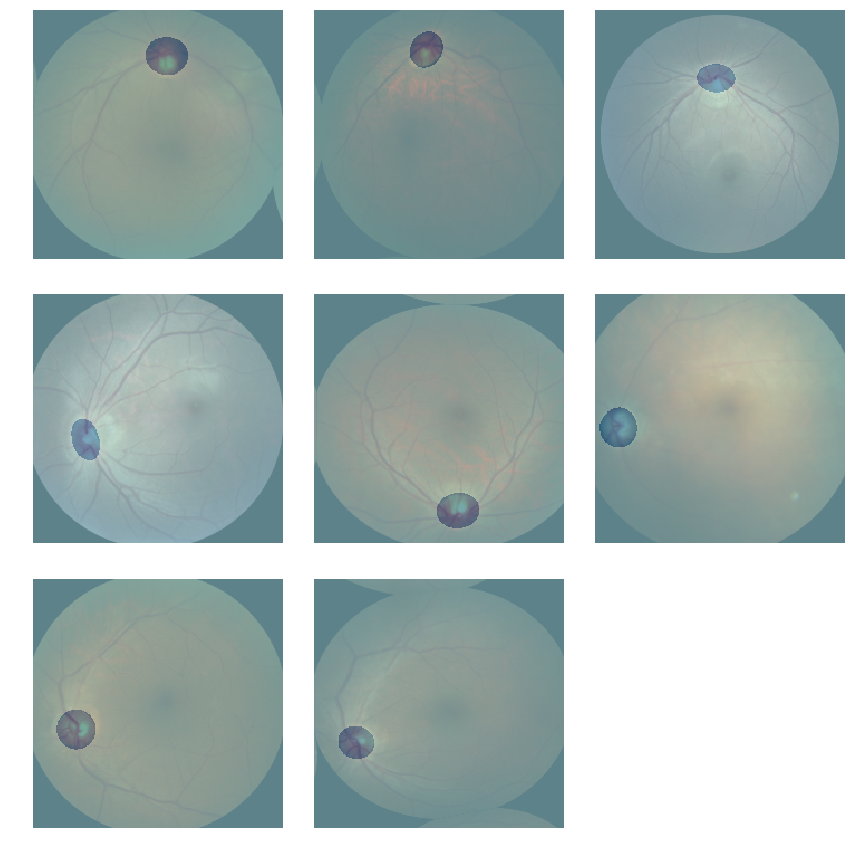

In [ ]:
data.show_batch(rows=3, alpha=0.6)

## Training

In [ ]:
cbfs = [ReduceLROnPlateauCallback,
        partial(SaveModelCallback,every='epoch',name='unet_224'),
        ShowGraph]

In [ ]:
learner = unet_learner(data, models.resnet50, metrics=[dice], callback_fns=cbfs)

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


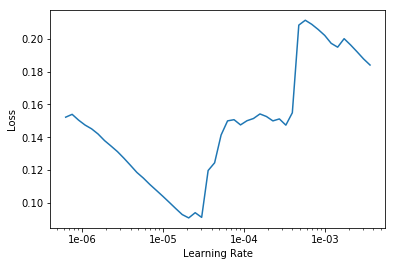

In [ ]:
learner.lr_find()
learner.recorder.plot()

epoch,train_loss,valid_loss,dice,time
0,0.031254,0.006844,0.998699,06:57
1,0.010050,0.004571,0.999015,07:09


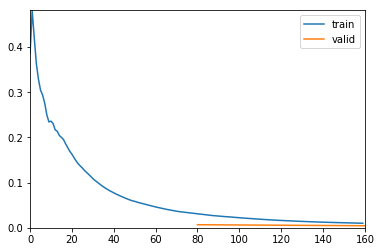

In [ ]:
lr= 1e-3
learner.fit_one_cycle(2, max_lr=slice(1e-4, lr), wd=1e-2)

In [ ]:
learner.load('unet_224_2')

In [ ]:
learner.save('unet_224-99dice')

## Evaluation

In [ ]:
interp = SegmentationInterpretation.from_learner(learner)
top_losses, top_idxs = interp.top_losses(sizes=(224,224))

In [ ]:
learner.data.classes


['Glaucoma', 'Non-Glaucoma']

In [ ]:
mean_cm, single_img_cm = interp._generate_confusion()

In [ ]:
interp._generate_confusion??

label,score
Non-Glaucoma,0.99924
Glaucoma,0.938336


,label,score
1,Non-Glaucoma,0.99924
0,Glaucoma,0.938336


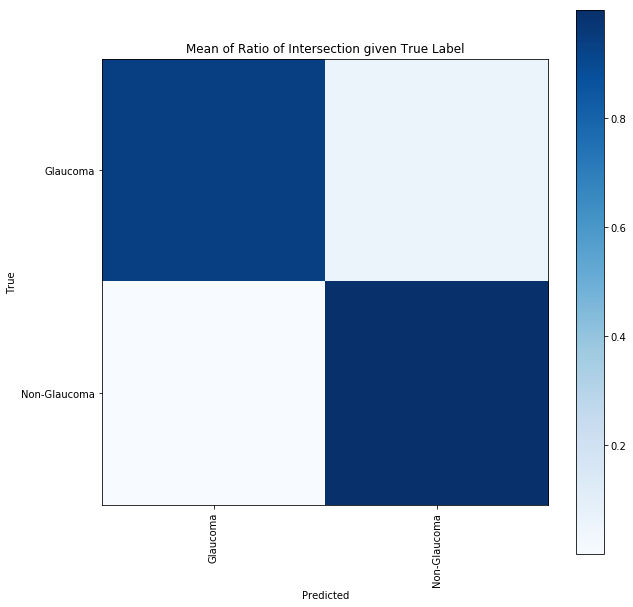

In [ ]:
df = interp._plot_intersect_cm(mean_cm, "Mean of Ratio of Intersection given True Label")
df

label,score
Non-Glaucoma,1
Glaucoma,0.776688


,label,score
1,Non-Glaucoma,1
0,Glaucoma,0.776688


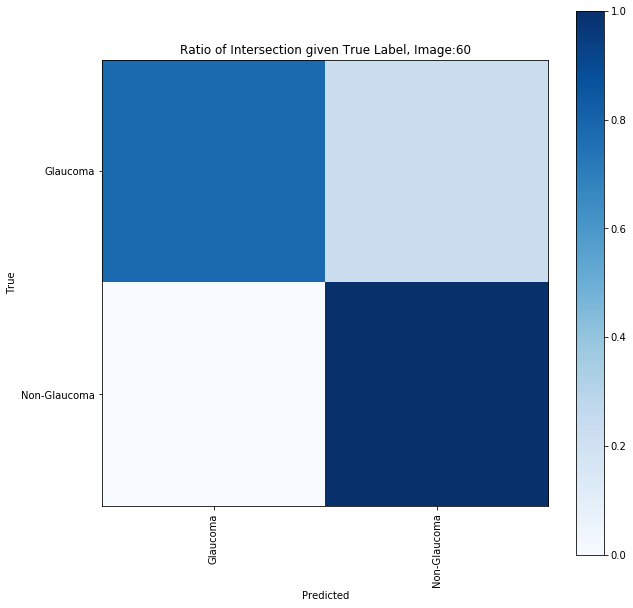

In [ ]:
i = top_idxs[0]
df = interp._plot_intersect_cm(single_img_cm[i], f"Ratio of Intersection given True Label, Image:{i}")
df

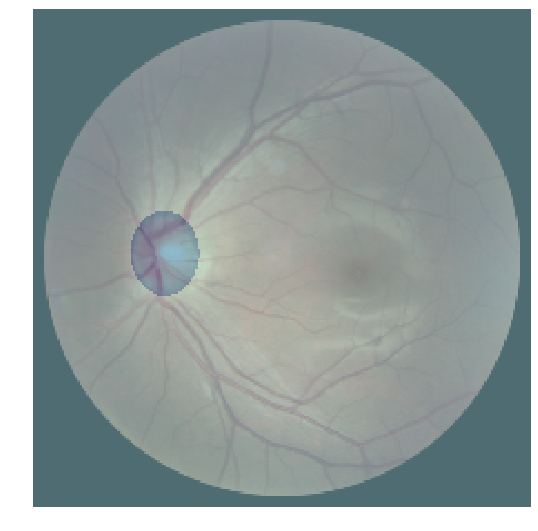

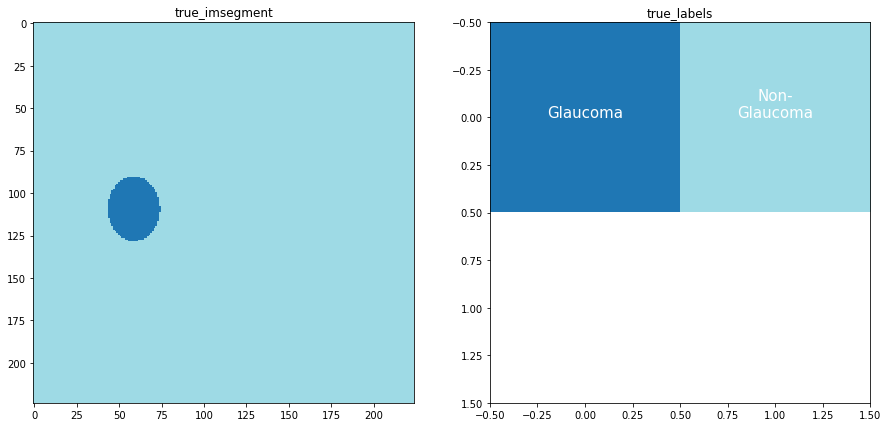

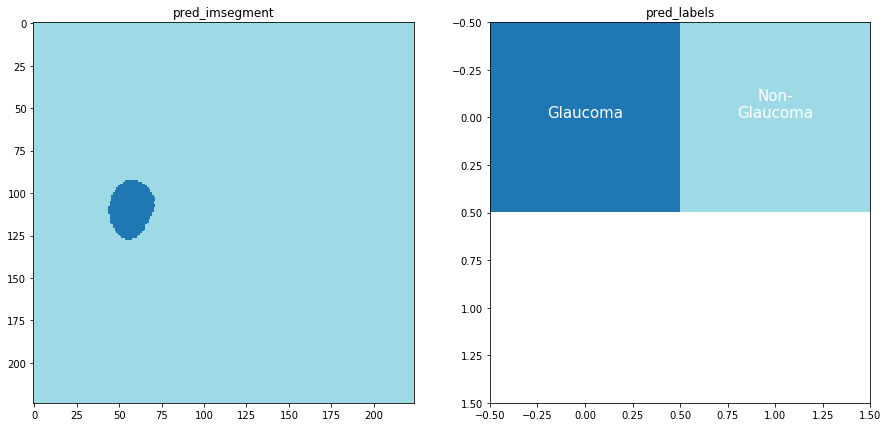

In [ ]:
interp.show_xyz(i, sz=15)

In [ ]:
learner.show_results()

#### Save Model

In [ ]:
learner.export(file='models/unet_224-99dice.pkl')

In [ ]:
stage_model= 'unet_224-99dice.pth'
model_file = 'unet_224-99dice.pkl'
path_local_models = Path('models')
model_local_path = str(path_local_models/model_file)
# upload_files_to_gcp(model_local_path, path_dermatology_models)
download_files_from_gcp(path_dermatology_models+model_file, path_local_models)
ls_gcp(path_dermatology_models)

Copying gs://medbotai/models/Dermatology/Glaucoma_models/unet_224-99dice.pkl...
\ [1/1 files][  1.3 GiB/  1.3 GiB] 100% Done 100.1 MiB/s ETA 00:00:00           
Operation completed over 1 objects/1.3 GiB.                                      
gs://medbotai/models/Dermatology/Glaucoma_models/res50_224_classification-975acc.pkl
gs://medbotai/models/Dermatology/Glaucoma_models/res50_224_classification-975acc.pth
gs://medbotai/models/Dermatology/Glaucoma_models/unet_224-99dice.pkl


## Inference

In [ ]:
class Inference():
  def __init__(self, path, file_name): 
    """ Inference 
    :path = path to the .pkl file
    :file_name
    return: class prediction
    """
    self.learner=load_learner(path, file_name)
    self.learner.model.float()
  
  def __call__(self, img):
    img=open_image(img) if not isinstance(img,fastai.vision.image.Image ) else img
    masks= self.learner.predict(img)
    img  = self.learner.data.one_item(img)[0]
    if getattr(self.learner.data,'norm',False): img = self.learner.data.denorm(img)
    img=torch.squeeze(img, dim=0)
    image= Image(img)
    return image, masks[0]

In [ ]:
predict_img_seg= Inference(path_local_models, model_file)

In [ ]:
img = open_image(glaucoma_files[2])

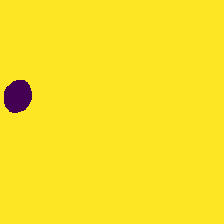

In [ ]:
image, mask_pred=predict_img_seg(img)
mask_pred

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


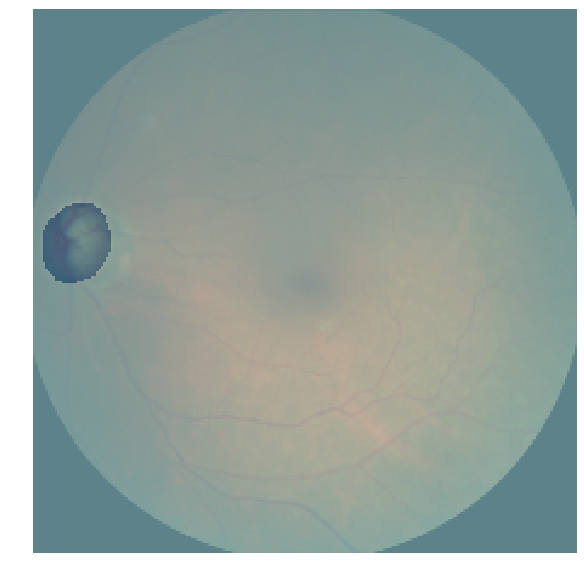

In [ ]:
image.show(y=mask_pred, figsize=(10,10), alpha=0.6)

In [ ]:
def show_mask(image: torch.Tensor, mask:torch.Tensor, alpha=0.5, cmap='tab20', figsize=(10,10)): 
    plt.figure(figsize=figsize)
    plt.imshow(image.permute(1,2,0), cmap='gray')
    plt.imshow(torch.squeeze(mask,dim=0), cmap=cmap, alpha=alpha)
    plt.grid(False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


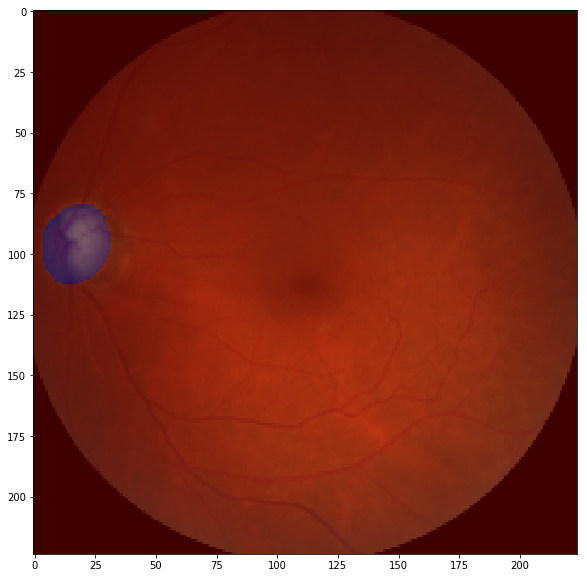

In [ ]:
show_mask(image.data, mask_pred.data, cmap='jet')

# Classification Tensorflow 2

In [ ]:
! pip install --upgrade pip
! pip install tf-nightly

In [ ]:
import tensorflow as tf
tf.__version__

'2.2.0-dev20200218'

In [ ]:
import tensorflow as tf 
from tensorflow import keras
from tensorflow.keras import layers
from fastai.vision import Path, get_image_files
from fastai import *

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

np.set_printoptions(precision=4)

In [ ]:
train_path = Path('GlaucomaData/Training400/')
train_path.ls()

[PosixPath('GlaucomaData/Training400/Glaucoma'),
 PosixPath('GlaucomaData/Training400/Non-Glaucoma'),
 PosixPath('GlaucomaData/Training400/.DS_Store')]

In [ ]:
img_fn = (train_path/'Glaucoma').ls()[0]
img_fn

PosixPath('GlaucomaData/Training400/Glaucoma/g0040.jpg')

In [ ]:
list_ds = tf.data.Dataset.list_files(str(train_path/'*/*.jpg'))

for f in list_ds.take(5): print(f)

tf.Tensor(b'GlaucomaData/Training400/Non-Glaucoma/n0045.jpg', shape=(), dtype=string)
tf.Tensor(b'GlaucomaData/Training400/Glaucoma/g0024.jpg', shape=(), dtype=string)
tf.Tensor(b'GlaucomaData/Training400/Non-Glaucoma/n0300.jpg', shape=(), dtype=string)
tf.Tensor(b'GlaucomaData/Training400/Non-Glaucoma/n0057.jpg', shape=(), dtype=string)
tf.Tensor(b'GlaucomaData/Training400/Glaucoma/g0031.jpg', shape=(), dtype=string)


In [ ]:
f

<tf.Tensor: shape=(), dtype=string, numpy=b'GlaucomaData/Training400/Glaucoma/g0031.jpg'>

In [ ]:
lbl= tf.strings.split(f,sep='/')[-2]; lbl

<tf.Tensor: id=100, shape=(), dtype=string, numpy=b'Non-Glaucoma'>

In [ ]:
print(type(lbl.numpy())); print(lbl.numpy())

<class 'bytes'>
b'Non-Glaucoma'


In [ ]:
file= tf.io.read_file(str(img_fn)); file

<tf.Tensor: id=102, shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x02\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\xff\xdb\x00C\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\x01\xff\xc0\x00\x11\x08\x08\x08\x08L\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x14

In [ ]:
def read_file(fn, **kwargs)->tf.Tensor:
  return tf.io.read_file(fn, **kwargs)

def parent_label(fn, sep='/', **kwargs):
  return tf.strings.split(fn, sep=sep, **kwargs)[-2]

In [ ]:
def process_data(file_path:Path):
  label = parent_label(file_path)
  image = read_file(file_path)
  image = tf.image.decode_jpeg(image)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size = [224,224])
  return image, label  

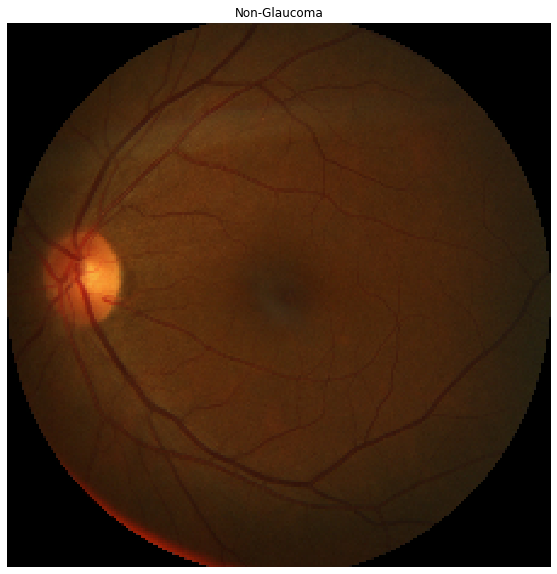

In [ ]:
file_path = next(iter(list_ds)) 
image, label = process_data(file_path)

def show(image, label, size=(10,10)):
  plt.figure(figsize=size)
  plt.imshow(image)
  plt.title(label.numpy().decode('utf-8'))
  plt.axis('off')

show(image, label)

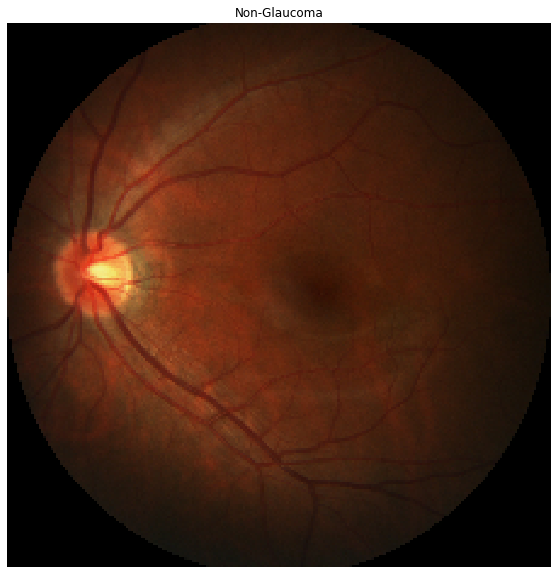

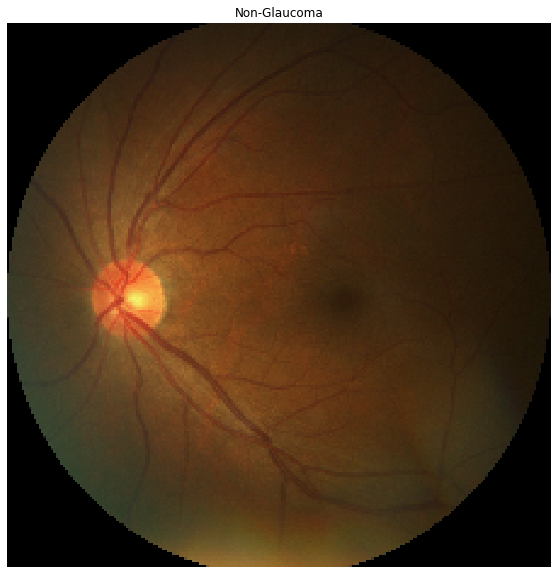

In [ ]:
pair_ds = list_ds.map(process_data)
for img,lbl in pair_ds.take(2): show(img, lbl)

In [ ]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
def prepare_for_training(ds, bs= 16, shuffle_bfs=1000, bfs_prefetch=AUTOTUNE,  cache=True, ):
  if cache: 
    if isinstance(cache, str): ds = ds.cache(cache)
    else: ds = ds.cache()

  ds = ds.shuffle(buffer_size=shuffle_bfs)
  ds = ds.repeat()
  ds = ds.batch(bs)
  ds = ds.prefetch(buffer_size= bfs_prefetch)
  return ds

In [ ]:
train_ds = prepare_for_training(pair_ds)

In [ ]:
img, lbl = next(iter(train_ds))

In [ ]:
img.shape, lbl

(TensorShape([16, 224, 224, 3]),
 <tf.Tensor: id=863, shape=(16,), dtype=string, numpy=
 array([b'Non-Glaucoma', b'Glaucoma', b'Non-Glaucoma', b'Non-Glaucoma', b'Non-Glaucoma', b'Non-Glaucoma',
        b'Non-Glaucoma', b'Non-Glaucoma', b'Non-Glaucoma', b'Non-Glaucoma', b'Non-Glaucoma', b'Non-Glaucoma',
        b'Non-Glaucoma', b'Non-Glaucoma', b'Non-Glaucoma', b'Glaucoma'], dtype=object)>)

In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
datagen = ImageDataGenerator(rotation_range=40,
                            width_shift_range=0.2,
                            height_shift_range=0.2,
                            shear_range=0.2,
                            zoom_range=0.2,
                            horizontal_flip=True,
                            fill_mode='nearest')